In [15]:
import czifile
from pathlib import Path
import os
import scipy
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology
from skimage import segmentation
from skimage import exposure
from skimage import data
from skimage import color
from skimage import filters

In [5]:
os.chdir('/Users/robinhood/Dropbox (HMS)/Data/imaging/processing')

# get current working directory with `cwd`
cur_dir = Path.cwd()
print(f"The current directory is {cur_dir}\n")

# specify a relative or absolute directory
#data_dir = Path("data")

# this needs to be reworked to be able to access a specific data folder. 

#img = czifile.imread(data_dir / 'wt_20210510_gthb_5.czi') will use when data file in other directory
czi = czifile.imread('wt_20210510_gthb_5.czi')
print(type(czi),czi.shape,czi.dtype)

# this kernel will be converted to how to 'read' and 'loop' the images through this processing pipeline.

The current directory is /Users/robinhood/Dropbox (HMS)/Data/imaging/processing

<class 'numpy.ndarray'> (1, 1, 5, 1, 47, 1024, 1024, 1) uint16


In [10]:
# Make dictionary of channels array indices
channel_dict = {'DAPI': 0, 'gt':2, 'pho':3, 'hb':4}

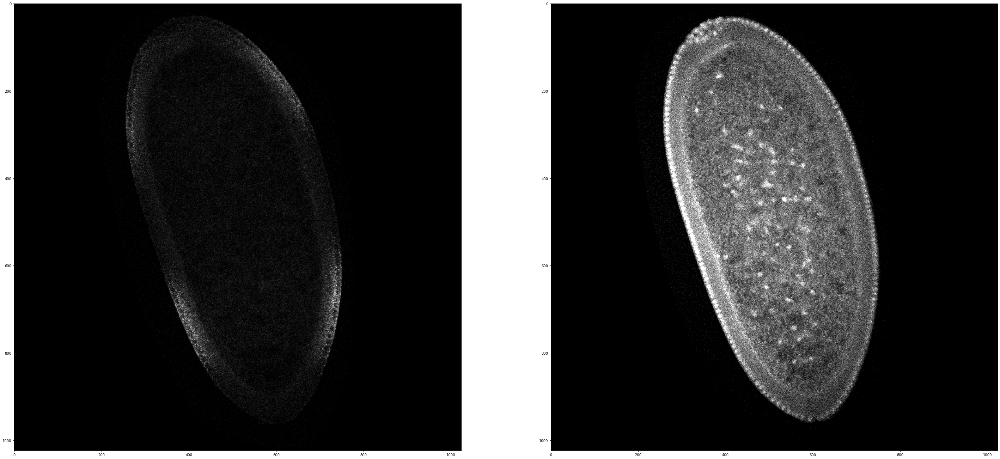

In [11]:
#Taking a look at the embryo

fig=plt.figure(figsize=(50, 50))  # increase image size
img=czi.squeeze() #this will squeeze the image above and make it easier for me to manipulate

ax=fig.add_subplot(1,2,1)
plt.imshow(img[channel_dict['gt'],27,:,:], cmap='gray', vmin=110, vmax=1000) # colormap and contrast limits

ax=fig.add_subplot(1,2,2)
plt.imshow(img[channel_dict['DAPI'],27,:,:], cmap='gray', vmin=110, vmax=1000) # colormap and contrast limits


In [12]:
img_DAPI=img[channel_dict['DAPI'],:,:,:]
img_gt=img[channel_dict['gt'],:,:,:]
img_pho=img[channel_dict['pho'],:,:,:]
img_hb=img[channel_dict['hb'],:,:,:]

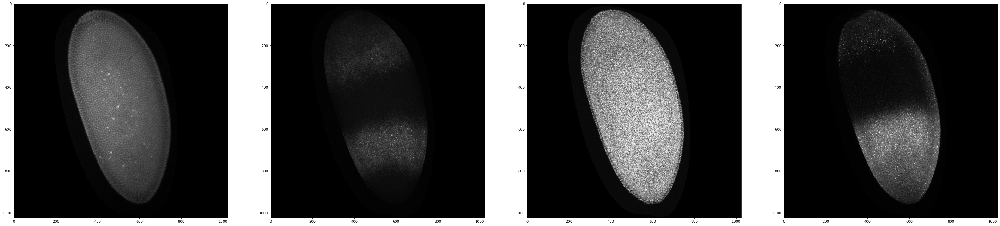

In [72]:
#create max projection. to make MIP you need to make sure you are only in 1 channel (the code above)
max_projection_DAPI = img_DAPI.max(0)
max_projection_gt = img_gt.max(0)
max_projection_pho = img_pho.max(0)
max_projection_hb = img_hb.max(0)

fig = plt.figure(figsize=(50,150))
ax=fig.add_subplot(1,4,1)
plt.imshow(max_projection_DAPI, cmap='gray', vmin=110, vmax=4000)
ax=fig.add_subplot(1,4,2)
plt.imshow(max_projection_gt, cmap='gray', vmin=110, vmax=4000)
ax=fig.add_subplot(1,4,3)
plt.imshow(max_projection_pho, cmap='gray', vmin=110, vmax=4000)
ax=fig.add_subplot(1,4,4)
plt.imshow(max_projection_hb, cmap='gray', vmin=110, vmax=4000)


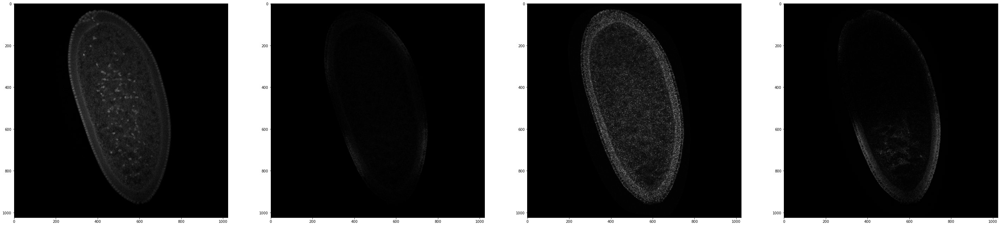

In [73]:

fig = plt.figure(figsize=(50,150))
ax=fig.add_subplot(1,4,1)
plt.imshow(img_DAPI[24,:,:], cmap='gray', vmin=110, vmax=4000)
ax=fig.add_subplot(1,4,2)
plt.imshow(img_gt[24,:,:], cmap='gray', vmin=110, vmax=4000)
ax=fig.add_subplot(1,4,3)
plt.imshow(img_pho[24,:,:], cmap='gray', vmin=110, vmax=4000)
ax=fig.add_subplot(1,4,4)
plt.imshow(img_hb[24,:,:], cmap='gray', vmin=110, vmax=4000)

13583.414433479309

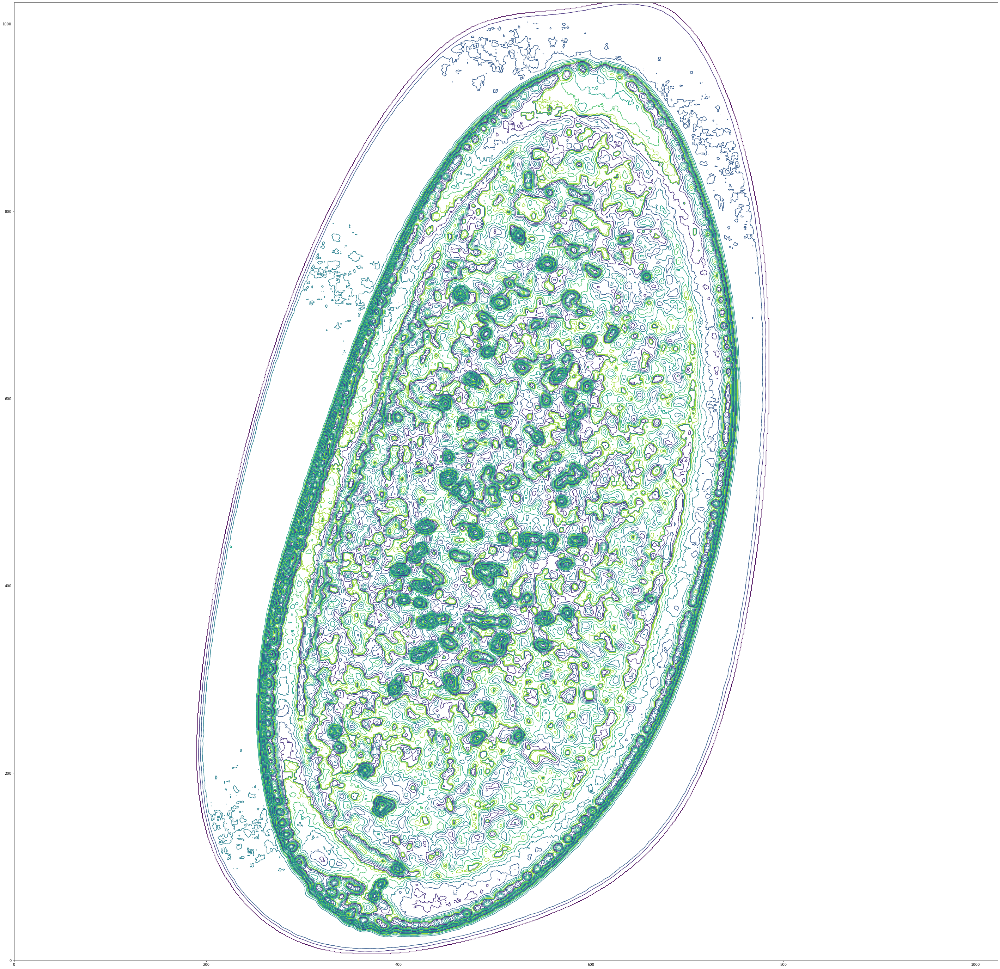

In [83]:
kernel_size = 7 # must be odd number
normalized = exposure.adjust_gamma(img_DAPI)
ndims = len(normalized.shape)
# normalized = exposure.equalize_hist(img_DAPI[24,:,:])
filtered = scipy.ndimage.convolve(normalized, np.ones((kernel_size,)*ndims))
# filtered = scipy.ndimage.percentile_filter(normalized, 90, size=kernel_size)
# filtered = scipy.ndimage.gaussian_filter(normalized, kernel_size)

# *** USE skimage.measure.regionprops() ***

hysterics = filters.apply_hysteresis_threshold(normalized, 100, np.max(normalized)-1)#1500) # WORKS WELL FOR WHOLE MASK
closedwfriends=morphology.binary_closing(hysterics)

# plt.imshow(filtered[24,:,:])# > np.mean(filtered))
fig, ax = plt.subplots(1,1,figsize=(50,50))
ax.contour(filtered[24,:,:])
np.mean(filtered)